# DESI + MaNGA Minimal Workflow
This notebook is intentionally compact with significant portions generated by Claude Code.

It provides one clean API (`PairExtractor`) and one demo call that does all of the following:
1. Loads one DESI sample using your `MultimodalDataset` into a one-sample `DataLoader`.
2. Visualizes the DESI image with your image function and plots the DESI spectrum.
3. Fetches and visualizes associated MaNGA maps.
4. Extracts a MaNGA spectrum at a chosen sky location, marks that location on an SDSS image, and plots the extracted spectrum.

In [1]:
import os
import sys
import math
import random
import torch

sys.path.append("..")
from io import BytesIO
from pathlib import Path
from urllib.request import urlretrieve

import numpy as np
import pandas as pd
import requests
import zarr
import matplotlib.pyplot as plt
from PIL import Image
from astropy.io import fits
from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.wcs import WCS
from torch.utils.data import DataLoader

from utils.DataProcessing import MultimodalDataset
from utils.AstroImageFunctions import make_rgb
from models.MAESimple import MaskedAutoencoderViT

from utils.DataProcessing import (
    generate_rest_indices,
    get_extreme_mask,
    get_kernel,
    safe_collate,
    smooth_data,
    MultimodalDataset,
    CreateMultimodalDataLoadersIter,
)


class PairExtractor:
    def __init__(
        self,
        desi_zarr_path='/pscratch/sd/p/pzehao/iron/desi_maglim_19_5.zarr',
        desi_parquet_path='/pscratch/sd/p/pzehao/iron/desi_zcat_maglim_19_5.parquet',
        drpall_cache='/pscratch/sd/p/pzehao/MyQuota/drpall-v3_1_1.fits',
        maps_cache_dir='/pscratch/sd/p/pzehao/MyQuota/manga_maps',
        cube_cache_dir='/pscratch/sd/p/pzehao/MyQuota/manga_cubes',
        map_daptype='HYB10-MILESHC-MASTARHC2',
    ):
        self.desi_zarr_path = Path(desi_zarr_path)
        self.desi_parquet_path = Path(desi_parquet_path)
        self.drpall_cache = Path(drpall_cache)
        self.maps_cache_dir = Path(maps_cache_dir)
        self.cube_cache_dir = Path(cube_cache_dir)
        self.map_daptype = map_daptype

        self.z = zarr.open(str(self.desi_zarr_path), mode='r')
        self.wave = np.asarray(self.z['WAVE'][:], dtype=np.float32)
        self._desi = None
        self._manga = None

    @staticmethod
    def _txt(x):
        if isinstance(x, (bytes, np.bytes_)):
            return x.decode('utf-8')
        return str(x)

    def desi_table(self):
        if self._desi is None:
            cols = [
                'TARGETID', 'TARGET_RA', 'TARGET_DEC', 'MEAN_FIBER_RA', 'MEAN_FIBER_DEC', 'Z'
            ]
            t = pd.read_parquet(self.desi_parquet_path, columns=cols).copy()
            t['TARGETID'] = t['TARGETID'].astype(np.int64)
            self._desi = t
        return self._desi

    def manga_table(self):
        if self._manga is None:
            from astropy.table import Table
            if not self.drpall_cache.exists():
                self.drpall_cache.parent.mkdir(parents=True, exist_ok=True)
                url = 'https://data.sdss.org/sas/dr17/manga/spectro/redux/v3_1_1/drpall-v3_1_1.fits'
                urlretrieve(url, self.drpall_cache)
            tbl = Table.read(self.drpall_cache, hdu=1)
            one_d = [c for c in tbl.colnames if len(tbl[c].shape) <= 1]
            df = tbl[one_d].to_pandas()
            df = df[['plateifu', 'objra', 'objdec']].copy()
            df['plateifu'] = df['plateifu'].map(self._txt)
            df = df.rename(columns={'objra': 'manga_ra', 'objdec': 'manga_dec'})
            self._manga = df
        return self._manga

    def get_loader(self, desi_index):
        ds = MultimodalDataset(str(self.desi_zarr_path), start=int(desi_index), end=int(desi_index)+1, augment=False, max_shift=0)
        loader = DataLoader(ds, batch_size=1, shuffle=False)
        return loader

    def match_manga(self, target_ra, target_dec):
        mt = self.manga_table()
        c1 = SkyCoord([target_ra] * u.deg, [target_dec] * u.deg)
        c2 = SkyCoord(mt['manga_ra'].to_numpy() * u.deg, mt['manga_dec'].to_numpy() * u.deg)
        idx, sep2d, _ = c1.match_to_catalog_sky(c2)
        return mt.iloc[int(idx[0])]['plateifu'], float(sep2d.arcsec[0])

    def _maps_path(self, plateifu):
        plate, ifu = plateifu.split('-')
        self.maps_cache_dir.mkdir(parents=True, exist_ok=True)
        p = self.maps_cache_dir / f'manga-{plateifu}-MAPS-{self.map_daptype}.fits.gz'
        if not p.exists():
            u = (
                f'https://data.sdss.org/sas/dr17/manga/spectro/analysis/v3_1_1/3.1.0/'
                f'{self.map_daptype}/{plate}/{ifu}/manga-{plateifu}-MAPS-{self.map_daptype}.fits.gz'
            )
            urlretrieve(u, p)
        return p

    def _cube_path(self, plateifu):
        plate = plateifu.split('-')[0]
        self.cube_cache_dir.mkdir(parents=True, exist_ok=True)
        p = self.cube_cache_dir / f'manga-{plateifu}-LOGCUBE.fits.gz'
        if not p.exists():
            u = f'https://data.sdss.org/sas/dr17/manga/spectro/redux/v3_1_1/{plate}/stack/manga-{plateifu}-LOGCUBE.fits.gz'
            urlretrieve(u, p)
        return p

    @staticmethod
    def _ch(header, token):
        token = token.lower()
        for k, v in header.items():
            if isinstance(k, str) and k.startswith('C') and isinstance(v, str) and token in v.lower():
                return int(k[1:]) - 1
        raise KeyError(token)

    @staticmethod
    def _masked(h, ext, idx=None):
        d = np.asarray(h[ext].data if idx is None else h[ext].data[idx], dtype=np.float32)
        bad = np.zeros_like(d, dtype=bool)
        me = f'{ext}_MASK'
        ie = f'{ext}_IVAR'
        if me in h:
            m = np.asarray(h[me].data if idx is None else h[me].data[idx])
            bad |= (m != 0)
        if ie in h:
            iv = np.asarray(h[ie].data if idx is None else h[ie].data[idx], dtype=np.float32)
            bad |= (~np.isfinite(iv)) | (iv <= 0)
        d[bad] = np.nan
        return d

    def get_maps(self, plateifu):
        p = self._maps_path(plateifu)
        with fits.open(p) as h:
            i_ha = self._ch(h['EMLINE_GFLUX'].header, 'Ha-6564')
            i_gv = self._ch(h['EMLINE_GVEL'].header, 'Ha-6564')
            try:
                i_dn = self._ch(h['SPECINDEX'].header, 'Dn4000')
            except KeyError:
                i_dn = self._ch(h['SPECINDEX'].header, 'D4000')
            return {
                'manga_image': self._masked(h, 'SPX_MFLUX'),
                'ha_flux': self._masked(h, 'EMLINE_GFLUX', i_ha),
                'gas_velocity': self._masked(h, 'EMLINE_GVEL', i_gv),
                'stellar_velocity': self._masked(h, 'STELLAR_VEL'),
                'dn4000': self._masked(h, 'SPECINDEX', i_dn),
            }

    def get_sdss_image(self, ra, dec, width=256, height=256, scale=0.262):
        u = (
            'https://skyserver.sdss.org/dr17/SkyServerWS/ImgCutout/getjpeg'
            f'?ra={ra}&dec={dec}&scale={scale}&width={width}&height={height}'
        )
        r = requests.get(u, timeout=60)
        r.raise_for_status()
        return np.array(Image.open(BytesIO(r.content)).convert('RGB'))

    def spectrum_from_cube(self, plateifu, ra, dec):
        p = self._cube_path(plateifu)
        with fits.open(p) as h:
            cube = np.asarray(h['FLUX'].data, dtype=np.float32)
            wave = np.asarray(h['WAVE'].data, dtype=np.float32)
            w = WCS(h['FLUX'].header).celestial
            x, y = w.world_to_pixel_values(float(ra), float(dec))
            ix, iy = int(np.round(x)), int(np.round(y))
            flux = cube[:, iy, ix]
            cx, cy = w.pixel_to_world_values(ix, iy)
        dra = (ra - cx) * np.cos(np.deg2rad(dec)) * 3600.0
        ddec = (dec - cy) * 3600.0
        sep = float(np.hypot(dra, ddec))
        return {'wave': wave, 'flux': flux, 'ix': ix, 'iy': iy, 'sep_arcsec': sep}

    @staticmethod
    def sky_to_cutout_pixel(ra, dec, ra0, dec0, width, height, scale_arcsec=0.262):
        dx = (ra - ra0) * np.cos(np.deg2rad(dec0)) * 3600.0 / scale_arcsec
        dy = (dec - dec0) * 3600.0 / scale_arcsec
        x = width / 2 + dx
        y = height / 2 - dy
        return float(x), float(y)

/global/cfs/cdirs/desi/users/pzehao/envs/peng/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
path = "/pscratch/sd/p/pzehao/DESIMAE/ProductionCheckpointsSimple/epoch=106-val_loss=-1.5629.ckpt"
# path = "/pscratch/sd/p/pzehao/DESIMAE/Final/epoch=097-val_loss=-2.2914.ckpt"
# path = "/pscratch/sd/p/pzehao/DESIMAE/ImageMHP/epoch=225-val_loss=-2.3145.ckpt"


prob = 0.7/15

model = MaskedAutoencoderViT(spec_dim=7781,
        max_epochs=600,
        warmup_epoch=5,
        mask_ratio=0.75,
        embed_dim        = 256,
        merged_depth     = 4,
        merged_num_heads = 8,
        s_depth          = 4,
        e_depth          = 4,
        s_num_heads      = 8,
        e_num_heads      = 8,
        decoder_embed_dim= 512,
        decoder_depth    = 8,
        decoder_num_heads= 16,
        decoder_MLP_coefficient = 1,
        patch_scheme={
            "patch_sizes": [1, 1, 2, 4, 8, 16, 32, 64, 128, 64, 32, 16, 8, 4, 2, 1],
            "mask_ratios": [1, 0.9, 0.8, 0.75, 0.7, 0.65, 0.6, 0.55, 0.5, 0.45, 0.4, 0.35, 0.3, 0.2, 0.1, 0.0],
            "probs": [0.3, prob, prob, prob, prob, prob, prob, prob, prob, prob, prob, prob, prob, prob, prob, prob]
        })
# load model from checkpoint (non-strict for backward compatibility)
checkpoint = torch.load(path, map_location="cpu")
model.load_state_dict(checkpoint["state_dict"], strict=False)
model.eval()

/tmp/ipykernel_163466/1591162330.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(path, map_location="cpu")


MaskedAutoencoderViT(
  (patch_embed1d): PatchEmbed1D(
    (proj): Conv1d(1, 256, kernel_size=(31,), stride=(31,))
    (norm): Identity()
  )
  (patch_embedimg): PatchEmbed(
    (proj): Conv2d(1, 256, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (s_attn): ModuleList(
    (0-3): 4 x Block(
      (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=256, out_features=768, bias=True)
        (q_norm): Identity()
        (k_norm): Identity()
        (attn_drop): Dropout(p=0.0, inplace=False)
        (norm): Identity()
        (proj): Linear(in_features=256, out_features=256, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): Identity()
      (drop_path1): Identity()
      (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=256, out_features=1024, bias=True)
        (act): GELU(approximate='none')
        (d

In [3]:
train_loader, val_loader, test_loader = CreateMultimodalDataLoadersIter(end=10000, train_size=3000, batch_size=32)

In [3]:
def visualize(model, spec: torch.Tensor, error: torch.Tensor, spec_pred: torch.Tensor, 
                error_pred: torch.Tensor, img: torch.Tensor, pred_img: torch.Tensor, error_img: torch.Tensor, mask_spec: torch.Tensor, mask_img: torch.Tensor, xy_pix: torch.Tensor,
                i: int = 0, ylim: int = 25, nsmooth: int = 3):
    kernel = get_kernel(nsmooth)

    # Extract relevant sample
    target = spec[i].detach().cpu().numpy()
    target_error = error[i].detach().cpu().numpy()
    pred_mean = spec_pred[i].detach().cpu().numpy()
    pred_sigma = np.exp(error_pred[i].detach().cpu().numpy())
    patch_mask_spec = mask_spec[i].detach().cpu()
    patch_mask_img = mask_img[i].detach().cpu()

    # Smooth signal and error
    target_smooth = smooth_data(target, kernel)
    target_error_smooth = smooth_data(target_error, kernel)

    # Compute intervals
    pred_upper = pred_mean + pred_sigma
    pred_lower = pred_mean - pred_sigma
    data_upper = target_smooth + target_error_smooth
    data_lower = target_smooth - target_error_smooth

    # Plot masked reconstruction
    fig, ax = plt.subplots(figsize=(10, 3))
    offset = model.left_patches * model.patch_size
    x_range = np.arange(offset, offset + len(target_smooth))
    ax.plot(x_range, target_smooth, label="Target (smoothed)", color="orange", linewidth=1)
    ax.fill_between(x_range, data_lower, data_upper, color="orange", alpha=0.3, label="±σ data (smoothed)")
    ax.plot(pred_mean, label="Prediction", color="blue")
    ax.fill_between(range(len(pred_mean)), pred_lower, pred_upper, color="blue", alpha=0.3, label="±σ predicted")
    patch_len = model.patch_size
    for j, masked in enumerate(patch_mask_spec):
        if masked:
            start = offset + j * patch_len
            end = offset + (j + 1) * patch_len
            ax.axvspan(start, end, color='red', alpha=0.05)
    ax.set_title(f"Patch Size = {model.patch_size*model.chunk_size}, {model.mask_ratio} (Val Sample {i})")
    ax.set_xlabel("Pixel index")
    ax.set_ylabel("Value")
    ax.set_ylim(-0, ylim)
    ax.legend()
    ax.grid(True)
    plt.tight_layout()

    N = model.patch_embedimg.num_patches
    p = pred_img[i].view(model.num_img_channels, N, model.img_patch, model.img_patch)
    p = p.view(model.num_img_channels, 128//model.img_patch, 128//model.img_patch, model.img_patch, model.img_patch)                  # (C, 8, 8, 16, 16)
    pred_img_formatted = p.permute(0,1,3,2,4).reshape(model.num_img_channels, 128, 128).detach().cpu().numpy()
    
    img_formatted = img[i].detach().cpu().numpy() 
    pred_rgb = make_rgb(pred_img_formatted[[0, 1, 3]], "ls_grz") 
    img_rgb = make_rgb(img_formatted[[0, 1, 3]], "ls_grz") 
    
    # mask: (384,) -> (6,64) -> (6,8,8)
    # m = patch_mask_img.float().view(6, 64).view(6, 8, 8)

    # # opacity per spatial patch = fraction of channels masked
    # alpha_patch = m.mean(dim=0).cpu().numpy()                 # (8,8)
    # alpha128 = np.kron(alpha_patch, np.ones((16, 16)))        # (128,128)
    xy_pix_val = xy_pix[i].detach().cpu().numpy()

    fig2, axs = plt.subplots(1, 2, figsize=(6, 3))
    axs[0].imshow(img_rgb)
    axs[0].set_title("True")

    ticks = np.arange(0, 129, 16)
    axs[0].set_xticks(ticks)
    axs[0].set_yticks(ticks)

    axs[0].set_xticklabels(ticks - 64)
    axs[0].set_yticklabels(64 - ticks)

    axs[0].grid(True, color='white', alpha=0.7, linewidth=0.5)

    axs[0].scatter(
        xy_pix_val[0] + 64,
        64 - xy_pix_val[1],
        c='red', s=50, marker='x'
    )

    axs[1].imshow(pred_rgb)
    # axs[1].imshow(alpha128, cmap="Reds", alpha=alpha128)
    axs[1].set_title("Masked Reconstruction")
    axs[1].axis("off")

    plt.tight_layout()
    
    plt.show()
    plt.close(fig)
    plt.close(fig2)

In [ ]:
batch_val = next(iter(val_loader))
x, spec, weig, error, img, img_w, img_e, z, xy_pix = batch_val
model.mask_ratio_img = 0
model.mask_ratio = 1
spec_loss, img_loss, total_loss, spec_pred, error_pred, pred_img, error_img, token_mask = model.forward(spec, weig, error, img, img_w, img_e, z, xy_pix)

token_mask = token_mask.unsqueeze(0).expand(spec.size(0), -1)
mask_spec = token_mask[:, :-model.num_patchesimg].long()
mask_img = token_mask[:, -model.num_patchesimg:].long()
for i in range(16):
    visualize(model, spec, error, spec_pred, error_pred, img, pred_img, error_img, mask_spec, mask_img, xy_pix, i)

Eligible pairs in current table: 521
Loaded row_idx=2, TARGETID=39627790139533968, DESI_INDEX=1108394
MaNGA match: 8616-9102 (sep=0.0060 arcsec)
z=0.03015, image shape=(6, 128, 128), spectrum shape=(7781,)


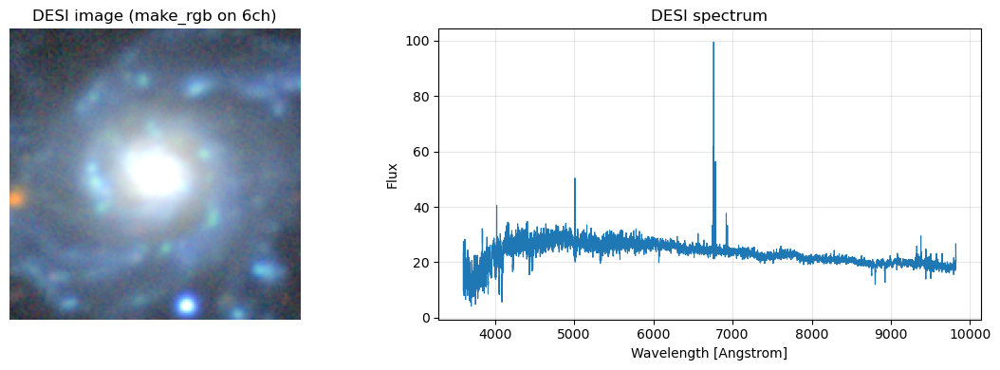

In [4]:
row_idx = 2  # Change this and re-run this cell.
# Operation 1: load one DESI sample into a one-sample loader
# This cell must be run after changing row_idx so downstream cells use new variables.

matches_csv = '/pscratch/sd/p/pzehao/desi_manga_matches.csv'
all_matches = pd.read_csv(matches_csv)

extractor = PairExtractor()
desi_tab = extractor.desi_table()

# Keep only cross-matches that exist in the loaded DESI table.
desi_targetids = set(desi_tab['TARGETID'].astype(np.int64).values)
matches_df = all_matches[all_matches['TARGETID'].isin(desi_targetids)].reset_index(drop=True)

if len(matches_df) == 0:
    raise RuntimeError('No eligible DESI-MaNGA pairs found in current DESI table')

# row_idx = 2  # Change this and re-run this cell.
if row_idx < 0 or row_idx >= len(matches_df):
    raise IndexError(f'row_idx={row_idx} out of range [0, {len(matches_df)-1}]')

match_row = matches_df.iloc[row_idx]
TARGETID_EXAMPLE = int(match_row['TARGETID'])

hit = desi_tab.loc[desi_tab['TARGETID'] == TARGETID_EXAMPLE]
if len(hit) == 0:
    raise KeyError(f'TARGETID={TARGETID_EXAMPLE} not found in DESI table after filtering')

DESI_INDEX = int(hit.index[0])
row = desi_tab.iloc[DESI_INDEX]

targetid = int(row['TARGETID'])
target_ra = float(row['TARGET_RA'])
target_dec = float(row['TARGET_DEC'])
fiber_ra = float(row['MEAN_FIBER_RA'])
fiber_dec = float(row['MEAN_FIBER_DEC'])
z = float(row['Z'])

loader = extractor.get_loader(DESI_INDEX)
batch = next(iter(loader))

spec_true = batch[0][0].detach().cpu().numpy()
img_6ch = batch[4][0].detach().cpu().numpy()
xy_pix = batch[8][0].detach().cpu().numpy()

plateifu, sep = extractor.match_manga(target_ra, target_dec)

print(f'Eligible pairs in current table: {len(matches_df)}')
print(f'Loaded row_idx={row_idx}, TARGETID={targetid}, DESI_INDEX={DESI_INDEX}')
print(f'MaNGA match: {plateifu} (sep={sep:.4f} arcsec)')
print(f'z={z:.5f}, image shape={img_6ch.shape}, spectrum shape={spec_true.shape}')

# Operation 2: visualize DESI image with your function + plot DESI spectrum
desi_rgb = make_rgb(img_6ch[[0, 1, 3]], 'ls_grz')
desi_wave = extractor.wave

fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ax[0].imshow(desi_rgb)
ax[0].set_title('DESI image (make_rgb on 6ch)')
ax[0].axis('off')

ax[1].plot(desi_wave, spec_true, lw=0.8)
ax[1].set_title('DESI spectrum')
ax[1].set_xlabel('Wavelength [Angstrom]')
ax[1].set_ylabel('Flux')
ax[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [5]:
device = next(model.parameters()).device
model.eval()

x, spec, weig, error, img, img_w, img_e, z, xy_pix = batch

spec   = spec.to(device)
weig   = weig.to(device)
error  = error.to(device)
img    = img.to(device)
img_w  = img_w.to(device)
img_e  = img_e.to(device)
z      = z.to(device)
xy_pix = xy_pix.to(device)

/tmp/ipykernel_163466/3000618673.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(path, map_location="cpu")


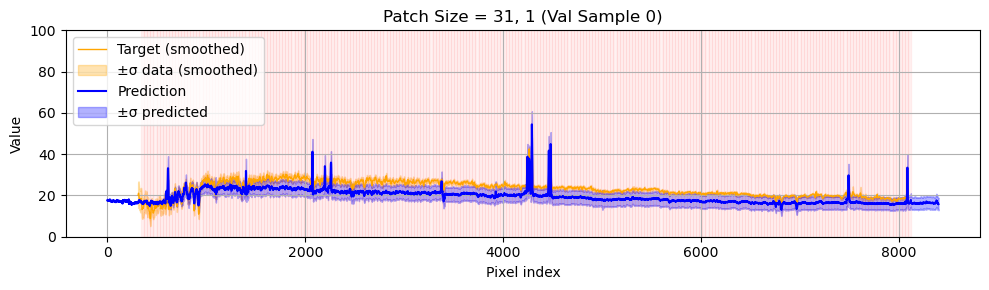

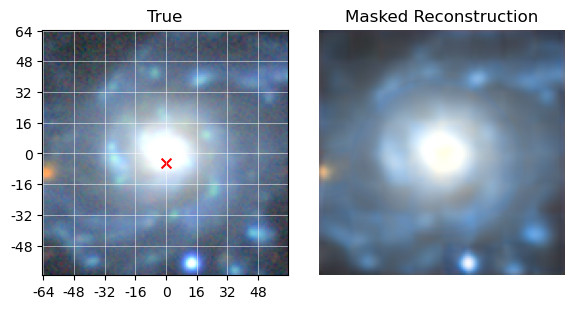

In [15]:
from models.MAESimple import MaskedAutoencoderViT
# path = "/pscratch/sd/p/pzehao/DESIMAE/ProductionCheckpointsFinal/epoch=005-val_loss=-1.0120.ckpt"
path = "/pscratch/sd/p/pzehao/DESIMAE/ProductionCheckpointsSimple/epoch=106-val_loss=-1.5629.ckpt"
# path = "/pscratch/sd/p/pzehao/DESIMAE/ImageMHP/epoch=225-val_loss=-2.3145.ckpt"

checkpoint = torch.load(path, map_location="cpu")
model.load_state_dict(checkpoint["state_dict"], strict=False)
model.mask_ratio = 1
model.mask_ratio_img = 0
# z[0] = 0.2429
xy_pix[0] = torch.tensor([0, -5])
spec_loss, img_loss, total_loss, spec_pred, error_pred, pred_img, error_img, token_mask = model.forward(spec, weig, error, img, img_w, img_e, z, xy_pix)

token_mask = token_mask.unsqueeze(0).expand(spec.size(0), -1)
mask_spec = token_mask[:, :-model.num_patchesimg].long()
mask_img = token_mask[:, -model.num_patchesimg:].long()
visualize(model, spec, error, spec_pred, error_pred, img, pred_img, error_img, mask_spec, mask_img, xy_pix, ylim=100)

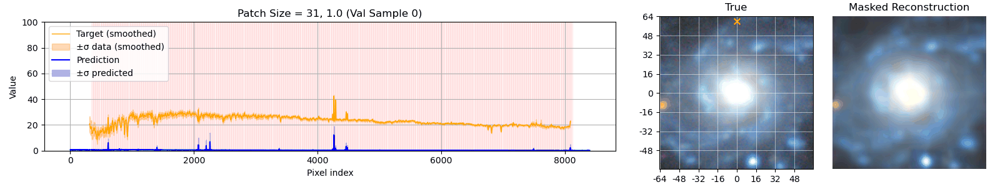

Saved xy_pix_spectrum_walk_100f.gif with 100 frames


In [16]:
import imageio.v2 as imageio
from IPython.display import Image, display

if 'batch' not in globals():
    raise RuntimeError('Run the data-loading cell first so batch/model/extractor are available.')

x, spec, weig, error, img, img_w, img_e, z, xy_pix = batch
device = next(model.parameters()).device
spec = spec.to(device)
weig = weig.to(device)
error = error.to(device)
img = img.to(device)
img_w = img_w.to(device)
img_e = img_e.to(device)
z = z.to(device)
xy_pix = xy_pix.to(device)

# Full spectrum masking, zero image masking.
model.mask_ratio = 1.0
model.mask_ratio_img = 0.0
model.eval()

# User controls
start_xy_pix = torch.tensor([0, 60.0], device=device, dtype=xy_pix.dtype)
end_xy_pix = torch.tensor([0, -60.0], device=device, dtype=xy_pix.dtype)
n_frames = 100

frames = []
orig_show = plt.show
orig_close = plt.close

try:
    with torch.no_grad():
        for t in np.linspace(0.0, 1.0, n_frames):
            xy_now = (1.0 - t) * start_xy_pix + t * end_xy_pix
            xy_now_pix = xy_pix.clone()
            xy_now_pix[0] = xy_now

            spec_loss, img_loss, total_loss, spec_pred, error_pred, pred_img, error_img, token_mask = model.forward(
                spec, weig, error, img, img_w, img_e, z, xy_now_pix
            )

            token_mask = token_mask.unsqueeze(0).expand(spec.size(0), -1)
            mask_spec = token_mask[:, :-model.num_patchesimg].long()
            mask_img = token_mask[:, -model.num_patchesimg:].long()

            # Use existing visualize() output and capture it to frame buffers.
            plt.show = lambda *args, **kwargs: None
            plt.close = lambda *args, **kwargs: None
            visualize(
                model,
                spec,
                error,
                spec_pred,
                error_pred,
                img,
                pred_img,
                error_img,
                mask_spec,
                mask_img,
                xy_now_pix,
                i=0,
                ylim=100,
            )

            fignums = plt.get_fignums()
            fig_arrays = []
            for num in fignums:
                fig = plt.figure(num)
                fig.canvas.draw()
                w, h = fig.canvas.get_width_height()
                arr = np.asarray(fig.canvas.buffer_rgba(), dtype=np.uint8).reshape(h, w, 4)[..., :3]
                fig_arrays.append(arr)

            if not fig_arrays:
                continue

            hmin = min(a.shape[0] for a in fig_arrays)
            frame = np.concatenate([a[:hmin] for a in fig_arrays], axis=1)
            frames.append(frame)

            for num in fignums:
                orig_close(plt.figure(num))
finally:
    plt.show = orig_show
    plt.close = orig_close

out_gif = 'xy_pix_spectrum_walk_100f.gif'
imageio.mimsave(out_gif, frames, duration=0.06)
display(Image(filename=out_gif))
print(f'Saved {out_gif} with {len(frames)} frames')



In [7]:
# Reusable DAP-like Halpha + kinematics extraction
# Fits local continuum + tied [NII]6548,6583 + Halpha with shared velocity/sigma.

from scipy.optimize import curve_fit

C_KMS = 299792.458
HA_REST = 6564.61
NII6548_REST = 6549.86
NII6583_REST = 6585.27
NII_RATIO_6583_TO_6548 = 3.06

# Dn4000 definition (rest frame)
DN4000_BLUE_MIN = 3850.0
DN4000_BLUE_MAX = 3950.0
DN4000_RED_MIN = 4000.0
DN4000_RED_MAX = 4100.0


def _gauss_from_flux(lam, flux_int, mu, sigma):
    amp = flux_int / (np.sqrt(2.0 * np.pi) * sigma)
    return amp * np.exp(-0.5 * ((lam - mu) / sigma) ** 2)


def _halpha_single_dap_like(wave_obs, flux_obs, z_obj, ivar_obs=None):
    wave_obs = np.asarray(wave_obs, dtype=np.float64)
    flux_obs = np.asarray(flux_obs, dtype=np.float64)

    if ivar_obs is not None:
        ivar_obs = np.asarray(ivar_obs, dtype=np.float64)

    lam0 = HA_REST * (1.0 + z_obj)
    win_half = 45.0 * (1.0 + z_obj)
    m = (
        np.isfinite(wave_obs)
        & np.isfinite(flux_obs)
        & (wave_obs >= lam0 - win_half)
        & (wave_obs <= lam0 + win_half)
    )
    if ivar_obs is not None:
        m &= np.isfinite(ivar_obs) & (ivar_obs > 0)

    w = wave_obs[m]
    f = flux_obs[m]
    if len(w) < 30:
        raise RuntimeError('Not enough valid pixels in Halpha window for fitting')

    side = ((w < lam0 - 12.0) | (w > lam0 + 12.0))
    c0 = float(np.nanmedian(f[side])) if np.any(side) else float(np.nanmedian(f))
    c1 = 0.0

    cont_guess = c0 + c1 * (w - lam0)
    pos = np.clip(f - cont_guess, 0.0, None)
    f_ha0 = max(float(np.trapz(pos, w)), 1e-3)
    f_nii6583_0 = 0.3 * f_ha0

    def model(lam, cont0, cont1, f_ha, f_nii6583, dv_kms, sigma_kms):
        z_shift = (1.0 + z_obj) * (1.0 + dv_kms / C_KMS)
        mu_ha = HA_REST * z_shift
        mu_6548 = NII6548_REST * z_shift
        mu_6583 = NII6583_REST * z_shift

        sigma_ha = (sigma_kms / C_KMS) * mu_ha
        sigma_6548 = (sigma_kms / C_KMS) * mu_6548
        sigma_6583 = (sigma_kms / C_KMS) * mu_6583

        f_nii6548 = f_nii6583 / NII_RATIO_6583_TO_6548

        y = cont0 + cont1 * (lam - lam0)
        y += _gauss_from_flux(lam, f_ha, mu_ha, sigma_ha)
        y += _gauss_from_flux(lam, f_nii6548, mu_6548, sigma_6548)
        y += _gauss_from_flux(lam, f_nii6583, mu_6583, sigma_6583)
        return y

    p0 = [c0, c1, f_ha0, f_nii6583_0, 0.0, 120.0]
    lower = [-np.inf, -np.inf, 0.0, 0.0, -400.0, 20.0]
    upper = [np.inf, np.inf, np.inf, np.inf, 400.0, 500.0]

    sigma_y = None
    if ivar_obs is not None:
        sigma_y = 1.0 / np.sqrt(np.clip(ivar_obs[m], 1e-20, None))

    popt, _ = curve_fit(
        model,
        w,
        f,
        p0=p0,
        bounds=(lower, upper),
        sigma=sigma_y,
        absolute_sigma=(sigma_y is not None),
        maxfev=20000,
    )

    cont0, cont1, f_ha, f_nii6583, dv_kms, sigma_kms = popt
    yfit = model(w, *popt)
    rms = float(np.sqrt(np.nanmean((f - yfit) ** 2)))

    # Compute Dn4000 on full spectrum
    blue_min_obs = DN4000_BLUE_MIN * (1.0 + z_obj)
    blue_max_obs = DN4000_BLUE_MAX * (1.0 + z_obj)
    red_min_obs = DN4000_RED_MIN * (1.0 + z_obj)
    red_max_obs = DN4000_RED_MAX * (1.0 + z_obj)
    
    m_blue = (wave_obs >= blue_min_obs) & (wave_obs <= blue_max_obs) & np.isfinite(flux_obs)
    m_red = (wave_obs >= red_min_obs) & (wave_obs <= red_max_obs) & np.isfinite(flux_obs)
    
    if np.any(m_blue) and np.any(m_red):
        flux_blue = np.mean(flux_obs[m_blue])
        flux_red = np.mean(flux_obs[m_red])
        dn4000 = float(flux_red / flux_blue) if flux_blue > 0 else np.nan
    else:
        dn4000 = np.nan

    return {
        'halpha_flux': float(f_ha),
        'nii6583_flux': float(f_nii6583),
        'dv_kms': float(dv_kms),
        'sigma_kms': float(sigma_kms),
        'fit_rms': rms,
        'dn4000': dn4000,
        'window_wave': w,
        'window_flux': f,
        'window_fit': yfit,
    }


def extract_halpha_kinematics(spectra, wave_obs, redshifts, ivar=None, left_patches=None, patch_size=None, return_dataframe=True):
    """
    Compute DAP-like Halpha intensity and kinematics from one or many spectra.

    Returns:
    - Single spectrum input: dict with scalar outputs + diagnostics
    - Batch input: DataFrame (default) or list[dict]
    """
    wave_obs = np.asarray(wave_obs, dtype=np.float64)
    L = len(wave_obs)

    spec_arr = np.asarray(spectra)
    is_single_input = (spec_arr.ndim == 1)
    if is_single_input:
        spec_arr = spec_arr[None, :]

    N = spec_arr.shape[0]

    z_arr = np.asarray(redshifts, dtype=np.float64)
    if z_arr.ndim == 0:
        z_arr = np.full(N, float(z_arr), dtype=np.float64)
    if len(z_arr) != N:
        raise ValueError(f'redshifts length {len(z_arr)} does not match number of spectra {N}')

    ivar_arr = None
    if ivar is not None:
        ivar_arr = np.asarray(ivar)
        if ivar_arr.ndim == 1:
            ivar_arr = ivar_arr[None, :]
        if ivar_arr.shape[0] != N:
            raise ValueError('ivar batch size does not match spectra batch size')

    def _extract_center(x):
        if x.shape[-1] == L:
            return x
        if left_patches is None or patch_size is None:
            raise ValueError('Spectrum length differs from wave grid; provide left_patches and patch_size for center extraction')
        offset = int(left_patches) * int(patch_size)
        y = x[..., offset:offset + L]
        if y.shape[-1] != L:
            raise ValueError(f'Cannot extract center region of length {L} from spectrum length {x.shape[-1]}')
        return y

    spec_arr = _extract_center(spec_arr)
    if ivar_arr is not None:
        ivar_arr = _extract_center(ivar_arr)

    rows = []
    diag = []
    for i in range(N):
        iv_i = None if ivar_arr is None else ivar_arr[i]
        fit = _halpha_single_dap_like(wave_obs, spec_arr[i], z_arr[i], iv_i)
        rows.append({
            'index': i,
            'halpha_flux': fit['halpha_flux'],
            'nii6583_flux': fit['nii6583_flux'],
            'dv_kms': fit['dv_kms'],
            'sigma_kms': fit['sigma_kms'],
            'fit_rms': fit['fit_rms'],
            'dn4000': fit['dn4000'],
        })
        diag.append(fit)

    if is_single_input:
        out = rows[0]
        out['diagnostics'] = diag[0]
        return out

    if return_dataframe:
        return pd.DataFrame(rows)
    return rows



In [8]:
device = next(model.parameters()).device
model.eval()

x, spec, weig, error, img, img_w, img_e, z, xy_pix = batch

# move inputs to GPU
spec   = spec.to(device)
weig   = weig.to(device)
error  = error.to(device)
img    = img.to(device)
img_w  = img_w.to(device)
img_e  = img_e.to(device)
z      = z.to(device)
xy_pix = xy_pix.to(device)

wave_obs = np.asarray(extractor.wave, dtype=np.float64)

# ---------------------------------------------------------
# choose finer sampling here
x_min, x_max, dx = -63, 63, 2
y_min, y_max, dy = -63, 63, 2
chunk_size = 64   # tune this: 32, 64, 128, ...
# ---------------------------------------------------------

# keep EXACT same ordering:
# outer loop: top -> bottom in y
# inner loop: left -> right in x
xs = torch.arange(x_min, x_max + 1, dx, device=device, dtype=xy_pix.dtype)
ys = torch.arange(y_max, y_min - 1, -dy, device=device, dtype=xy_pix.dtype)

nx = xs.numel()
ny = ys.numel()

coords = []
for i in range(ny):
    for j in range(nx):
        coords.append([xs[j], ys[i]])

coords = torch.stack(
    [torch.as_tensor(c, device=device, dtype=xy_pix.dtype) for c in coords],
    dim=0
)  # (N, 2)

N = coords.shape[0]

# outputs in flattened row-major order matching coords
halphas_flat       = np.zeros(N, dtype=np.float64)
nii6583_fluxs_flat = np.zeros(N, dtype=np.float64)
dv_kmses_flat      = np.zeros(N, dtype=np.float64)
dn4000s_flat       = np.zeros(N, dtype=np.float64)

with torch.no_grad():
    for start in range(0, N, chunk_size):
        end = min(start + chunk_size, N)
        bsz = end - start

        xy_pix_chunk = coords[start:end]              # (bsz, 2)

        # repeat single example only for this chunk
        spec_b   = spec.repeat(bsz, 1)
        weig_b   = weig.repeat(bsz, 1)
        error_b  = error.repeat(bsz, 1)
        img_b    = img.repeat(bsz, 1, 1, 1)
        img_w_b  = img_w.repeat(bsz, 1, 1, 1)
        img_e_b  = img_e.repeat(bsz, 1, 1, 1)
        z_b      = z.repeat(bsz)

        spec_loss, img_loss, total_loss, spec_pred, error_pred, pred_img, error_img, token_mask = model.forward(
            spec_b, weig_b, error_b, img_b, img_w_b, img_e_b, z_b, xy_pix_chunk
        )

        pred_np = spec_pred.detach().cpu().numpy()
        z_np    = z_b.detach().cpu().numpy()

        values_all = extract_halpha_kinematics(
            spectra=pred_np,
            wave_obs=wave_obs,
            redshifts=z_np,
            left_patches=model.left_patches,
            patch_size=model.patch_size,
            return_dataframe=False,
        )

        for k, values in enumerate(values_all):
            idx = start + k
            halphas_flat[idx]       = values['halpha_flux']
            nii6583_fluxs_flat[idx] = values['nii6583_flux']
            dv_kmses_flat[idx]      = values['dv_kms']
            dn4000s_flat[idx]       = values['dn4000']
        print(f'Processed {end}/{N} coordinates')
# reshape back to grid with SAME ordering as original loop
halphas       = halphas_flat.reshape(ny, nx)
nii6583_fluxs = nii6583_fluxs_flat.reshape(ny, nx)
dv_kmses      = dv_kmses_flat.reshape(ny, nx)
dn4000s       = dn4000s_flat.reshape(ny, nx)

# np.save('halphas_simple.npy', halphas)

Processed 64/4096 coordinates
Processed 128/4096 coordinates
Processed 192/4096 coordinates
Processed 256/4096 coordinates
Processed 320/4096 coordinates
Processed 384/4096 coordinates
Processed 448/4096 coordinates
Processed 512/4096 coordinates
Processed 576/4096 coordinates
Processed 640/4096 coordinates
Processed 704/4096 coordinates
Processed 768/4096 coordinates
Processed 832/4096 coordinates
Processed 896/4096 coordinates
Processed 960/4096 coordinates
Processed 1024/4096 coordinates
Processed 1088/4096 coordinates
Processed 1152/4096 coordinates
Processed 1216/4096 coordinates
Processed 1280/4096 coordinates
Processed 1344/4096 coordinates
Processed 1408/4096 coordinates
Processed 1472/4096 coordinates
Processed 1536/4096 coordinates
Processed 1600/4096 coordinates
Processed 1664/4096 coordinates
Processed 1728/4096 coordinates
Processed 1792/4096 coordinates
Processed 1856/4096 coordinates
Processed 1920/4096 coordinates
Processed 1984/4096 coordinates
Processed 2048/4096 coor

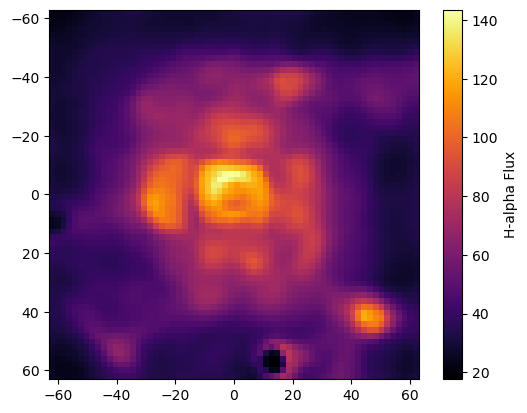

In [26]:
plt.imshow(halphas, origin='lower', extent=(x_min, x_max, y_min, y_max), cmap='inferno')
plt.colorbar(label='H-alpha Flux')
# Flip y axis
plt.gca().invert_yaxis()
plt.show()

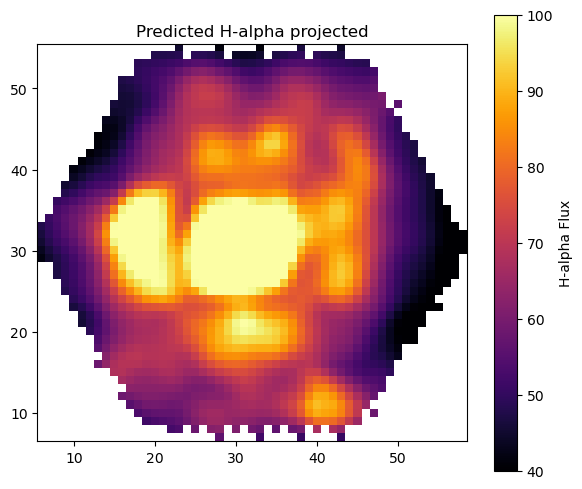

Original halphas shape (unchanged): (64, 64)
MaNGA-style map shape: (62, 62)


In [11]:
from scipy.interpolate import griddata

if 'halphas' not in globals():
    raise RuntimeError("halphas not found in notebook state. Run the H-alpha compute cell first.")
if 'extractor' not in globals() or 'target_ra' not in globals() or 'target_dec' not in globals():
    raise RuntimeError("Missing extractor/target_ra/target_dec in notebook state.")

# Keep original array untouched; work on a separate view.
halphas_src = np.asarray(halphas, dtype=np.float64)
if halphas_src.ndim != 2:
    raise ValueError(f"Expected 2D halphas array, got shape {halphas_src.shape}")

# Infer source DESI offset grid (x,y in model/DESI xy_pix convention).
if 'xs' in globals() and 'ys' in globals():
    xs_arr = xs.detach().cpu().numpy() if hasattr(xs, 'detach') else np.asarray(xs)
    ys_arr = ys.detach().cpu().numpy() if hasattr(ys, 'detach') else np.asarray(ys)
    if xs_arr.size == halphas_src.shape[1] and ys_arr.size == halphas_src.shape[0]:
        x_src = xs_arr.astype(np.float64)
        y_src = ys_arr.astype(np.float64)
    else:
        x_src = np.linspace(-60.0, 60.0, halphas_src.shape[1])
        y_src = np.linspace(60.0, -60.0, halphas_src.shape[0])
else:
    x_src = np.linspace(-60.0, 60.0, halphas_src.shape[1])
    y_src = np.linspace(60.0, -60.0, halphas_src.shape[0])

xx_src, yy_src = np.meshgrid(x_src, y_src)
valid_src = np.isfinite(halphas_src)
if int(valid_src.sum()) < 10:
    raise RuntimeError("Too few finite halphas values to interpolate.")

src_points = np.column_stack([xx_src[valid_src], yy_src[valid_src]])
src_values = halphas_src[valid_src]

if 'plateifu' not in globals():
    plateifu, _ = extractor.match_manga(float(target_ra), float(target_dec))

# Use MaNGA MAPS products as reference for shape/footprint/orientation.
if 'maps' not in globals() or not isinstance(maps, dict) or 'ha_flux' not in maps:
    maps = extractor.get_maps(plateifu)
ha_ref = np.asarray(maps['ha_flux'], dtype=np.float64)
ny, nx = ha_ref.shape
manga_footprint = np.isfinite(ha_ref)

maps_path = extractor._maps_path(plateifu)
with fits.open(maps_path) as h:
    wcs_map = WCS(h['SPX_MFLUX'].header).celestial

iy, ix = np.indices((ny, nx))
ra_grid, dec_grid = wcs_map.pixel_to_world_values(ix.ravel(), iy.ravel())

# Match dataset/model xy convention exactly: x uses RA sign flip, y keeps Dec sign.
pix_scale = 0.262
ra_to_x_sign = -1.0
dec_to_y_sign = -1.0
x_off = (
    ra_to_x_sign * (ra_grid - float(target_ra)) * np.cos(np.deg2rad(float(target_dec))) * 3600.0 / pix_scale
).reshape(ny, nx)
y_off = (
    dec_to_y_sign * (dec_grid - float(target_dec)) * 3600.0 / pix_scale
).reshape(ny, nx)

sample_points = np.column_stack([x_off.ravel(), y_off.ravel()])
halpha_linear = griddata(src_points, src_values, sample_points, method='linear').reshape(ny, nx)
halpha_nearest = griddata(src_points, src_values, sample_points, method='nearest').reshape(ny, nx)

inside_src = (
    (x_off >= np.min(x_src)) & (x_off <= np.max(x_src)) &
    (y_off >= np.min(y_src)) & (y_off <= np.max(y_src))
)

# Keep only valid source-coverage region; nearest fill only for tiny holes inside it.
halpha_proj = np.where(inside_src, halpha_linear, np.nan)
need_fill = np.isnan(halpha_proj) & inside_src
halpha_proj[need_fill] = halpha_nearest[need_fill]

# Final map: exact MaNGA footprint, native MaNGA shape.
halpha_manga_style = np.where(manga_footprint, halpha_proj, np.nan)

plt.figure(figsize=(6, 5))
im = plt.imshow(halpha_manga_style, origin='lower', cmap='inferno', vmin=40, vmax=100)
plt.colorbar(im, label='H-alpha Flux')
plt.title('Predicted H-alpha projected')

# Zoom to MaNGA footprint so framing matches the map-view style better.
yy_f, xx_f = np.where(np.isfinite(halpha_manga_style))
if yy_f.size > 0:
    plt.xlim(xx_f.min() - 0.5, xx_f.max() + 0.5)
    plt.ylim(yy_f.min() - 0.5, yy_f.max() + 0.5)
plt.gca().set_aspect('equal')
plt.tight_layout()
plt.show()

print(f"Original halphas shape (unchanged): {halphas_src.shape}")
print(f"MaNGA-style map shape: {halpha_manga_style.shape}")

MaNGA match: 8616-9102 (sep=0.006 arcsec)


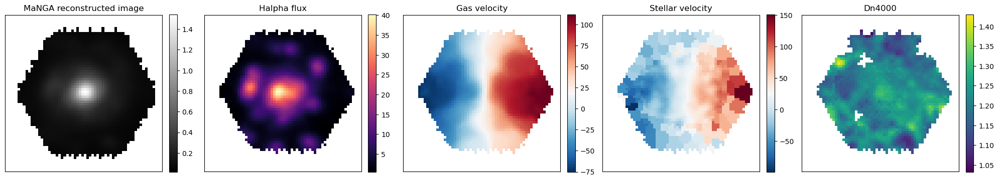

In [8]:
# Operation 3: fetch corresponding MaNGA object and visualize maps
plateifu, match_sep_arcsec = extractor.match_manga(target_ra, target_dec)
if match_sep_arcsec > 1.0:
    raise RuntimeError(f'Nearest MaNGA object too far: {match_sep_arcsec:.3f} arcsec')

maps = extractor.get_maps(plateifu)
print(f'MaNGA match: {plateifu} (sep={match_sep_arcsec:.3f} arcsec)')

fig, ax = plt.subplots(1, 5, figsize=(20, 4))
titles = [
    ('manga_image', 'MaNGA reconstructed image', 'gray'),
    ('ha_flux', 'Halpha flux', 'magma'),
    ('gas_velocity', 'Gas velocity', 'RdBu_r'),
    ('stellar_velocity', 'Stellar velocity', 'RdBu_r'),
    ('dn4000', 'Dn4000', 'viridis'),
]

for i, (k, t, c) in enumerate(titles):
    im = ax[i].imshow(maps[k], origin='lower', cmap=c)
    ax[i].set_title(t)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    plt.colorbar(im, ax=ax[i], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

a string value was expected. [astropy.wcs.wcs]


cube spaxel=(ix,iy)=(31,31), sky->spaxel sep=0.188 arcsec
DESI vs MaNGA spectral shape corr: 0.807


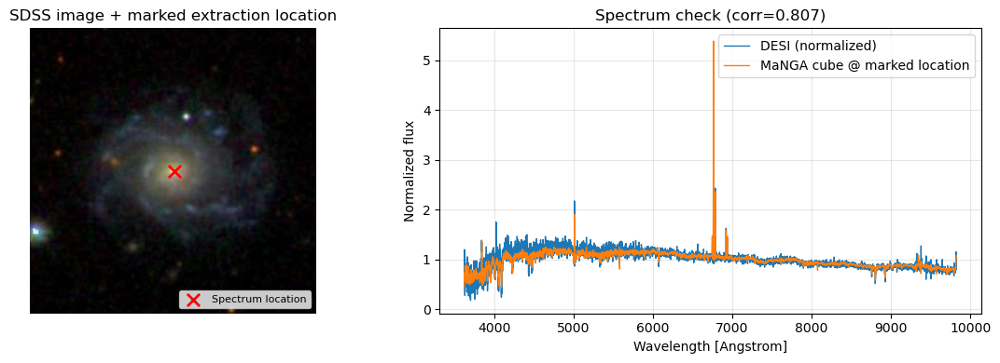

In [9]:
# Operation 4: extract MaNGA cube spectrum at chosen location, mark location on SDSS image, show spectrum
manga_spec = extractor.spectrum_from_cube(plateifu, fiber_ra, fiber_dec)
sdss_img = extractor.get_sdss_image(target_ra, target_dec, width=300, height=300, scale=0.262)
x_sdss, y_sdss = extractor.sky_to_cutout_pixel(
    ra=fiber_ra, dec=fiber_dec,
    ra0=target_ra, dec0=target_dec,
    width=300, height=300, scale_arcsec=0.262,
 )

# concise consistency check against DESI spectrum
wmin = max(np.nanmin(desi_wave), np.nanmin(manga_spec['wave']))
wmax = min(np.nanmax(desi_wave), np.nanmax(manga_spec['wave']))
m_d = (desi_wave >= wmin) & (desi_wave <= wmax) & np.isfinite(spec_true)
m_m = (manga_spec['wave'] >= wmin) & (manga_spec['wave'] <= wmax) & np.isfinite(manga_spec['flux'])
manga_on_desi = np.interp(desi_wave[m_d], manga_spec['wave'][m_m], manga_spec['flux'][m_m])
desi_norm = spec_true[m_d] / np.nanmedian(spec_true[m_d])
manga_norm = manga_on_desi / np.nanmedian(manga_on_desi)
v = np.isfinite(desi_norm) & np.isfinite(manga_norm)
corr = float(np.corrcoef(desi_norm[v], manga_norm[v])[0, 1])

print(f"cube spaxel=(ix,iy)=({manga_spec['ix']},{manga_spec['iy']}), sky->spaxel sep={manga_spec['sep_arcsec']:.3f} arcsec")
print(f'DESI vs MaNGA spectral shape corr: {corr:.3f}')

fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ax[0].imshow(sdss_img)
ax[0].scatter([x_sdss], [y_sdss], s=90, marker='x', c='red', linewidths=2, label='Spectrum location')
ax[0].set_title('SDSS image + marked extraction location')
ax[0].legend(loc='lower right', fontsize=8)
ax[0].axis('off')

ax[1].plot(desi_wave[m_d], desi_norm, lw=1.0, label='DESI (normalized)')
ax[1].plot(desi_wave[m_d], manga_norm, lw=1.0, label='MaNGA cube @ marked location')
ax[1].set_title(f'Spectrum check (corr={corr:.3f})')
ax[1].set_xlabel('Wavelength [Angstrom]')
ax[1].set_ylabel('Normalized flux')
ax[1].grid(alpha=0.3)
ax[1].legend()

plt.tight_layout()
plt.show()

a string value was expected. [astropy.wcs.wcs]


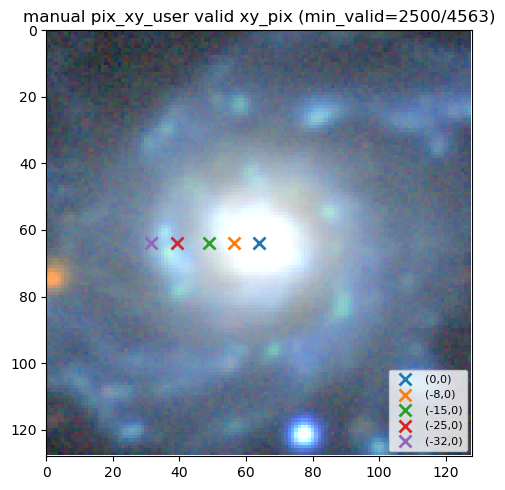

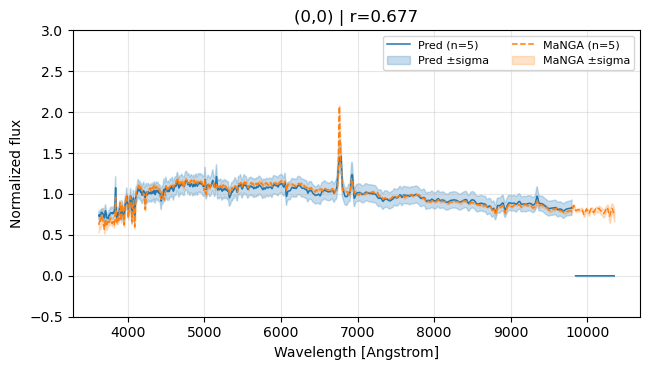

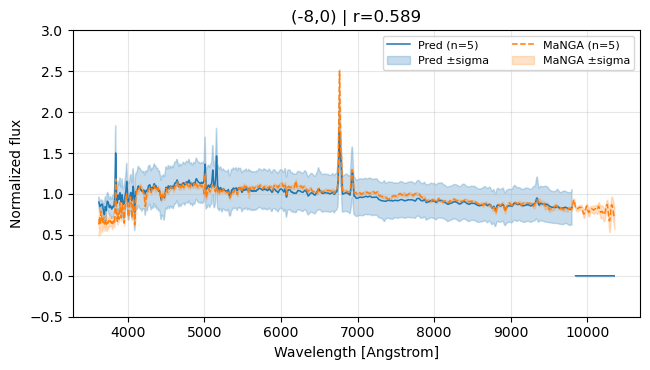

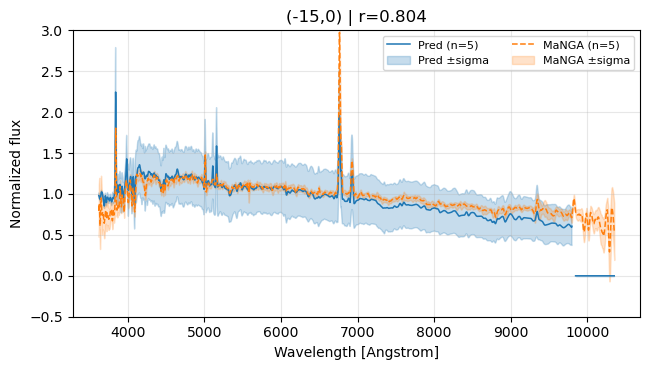

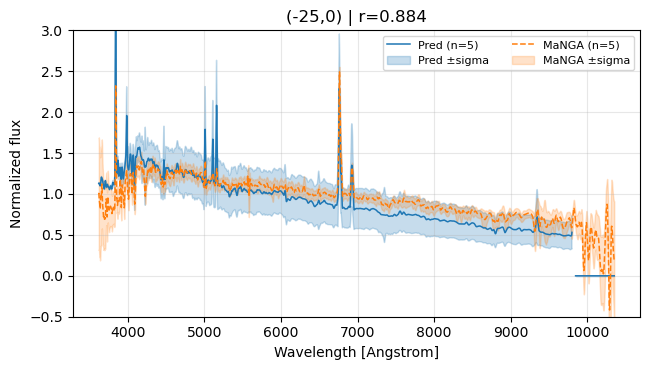

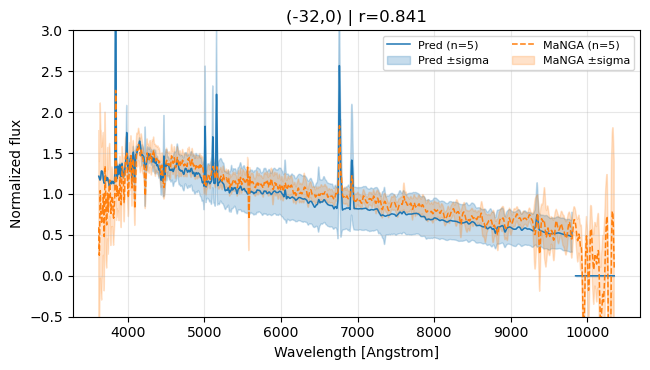

 xy_pix        r  valid_points manga_spaxel  raw_valid_count
  (0,0) 0.677271          4542      (31,31)             4562
 (-8,0) 0.589475          4542      (35,31)             4562
(-15,0) 0.804167          4538      (39,31)             4558
(-25,0) 0.883917          4540      (44,31)             4560
(-32,0) 0.841164          4542      (48,31)             4562


In [116]:
# Unified model-vs-MaNGA comparison with shared smoothing + optional user pix_xy input
pix_scale = 0.262  # arcsec per DESI pixel
plateifu, _ = extractor.match_manga(target_ra, target_dec)

# ---------------- User controls ----------------
nsmooth_shared = 5  # same smoothing for Pred and MaNGA
pix_xy_user = [(0, 0), (-8, 0), (-16, 0), (-24, 0), (-32, 0)]
min_valid = 2500     # minimum valid MaNGA spectral pixels for candidate spaxels
n_locations = 5      # number of comparison locations
kernel_shared = get_kernel(nsmooth_shared)
# ----------------------------------------------

# Load MaNGA cube and quality masks once
cube_path = extractor._cube_path(plateifu)
with fits.open(cube_path) as h:
    cube_flux = np.asarray(h['FLUX'].data, dtype=np.float64)
    wave_manga = np.asarray(h['WAVE'].data, dtype=np.float64)
    cube_ivar = np.asarray(h['IVAR'].data, dtype=np.float64) if 'IVAR' in h else None
    cube_mask = np.asarray(h['MASK'].data) if 'MASK' in h else None
    w = WCS(h['FLUX'].header).celestial
    ny, nx = cube_flux.shape[1], cube_flux.shape[2]

n_wave = cube_flux.shape[0]
bad = ~np.isfinite(cube_flux)
if cube_ivar is not None:
    bad |= (~np.isfinite(cube_ivar)) | (cube_ivar <= 0)
if cube_mask is not None:
    bad |= (cube_mask != 0)
valid_counts = np.sum(~bad, axis=0)

# Map MaNGA spaxels to DESI xy_pix offsets
iy_grid, ix_grid = np.indices((ny, nx))
ra_grid, dec_grid = w.pixel_to_world_values(ix_grid.ravel(), iy_grid.ravel())
x_off = (ra_grid - target_ra) * np.cos(np.deg2rad(target_dec)) * 3600.0 / pix_scale
y_off = (dec_grid - target_dec) * 3600.0 / pix_scale
x_off = x_off.reshape(ny, nx)
y_off = y_off.reshape(ny, nx)

inside_desi = (np.abs(x_off) <= 63) & (np.abs(y_off) <= 63)
good = (valid_counts >= min_valid) & inside_desi
if np.sum(good) < n_locations:
    for mv in (1800, 1200):
        good = (valid_counts >= mv) & inside_desi
        if np.sum(good) >= n_locations:
            min_valid = mv
            break
if np.sum(good) < n_locations:
    raise RuntimeError('Could not find enough valid MaNGA spaxels inside DESI bounds.')

selected = []

# Optional manual interface: user-provided pix_xy in DESI offset units
if pix_xy_user is not None:
    req = np.asarray(pix_xy_user, dtype=np.float64)
    if req.ndim != 2 or req.shape[1] != 2:
        raise ValueError('pix_xy_user must be a list/array of shape (N,2), e.g. [(0,0), (20,-30)]')
    if len(req) != n_locations:
        raise ValueError(f'Please provide exactly {n_locations} pix_xy points in pix_xy_user')
    if np.any(np.abs(req) > 63):
        raise ValueError('All pix_xy_user offsets must be within [-63, 63] for 128x128 DESI image')

    for dx, dy in req:
        d2 = (x_off - dx) ** 2 + (y_off - dy) ** 2
        d2 = np.where(good, d2, np.inf)
        # Avoid duplicate MaNGA spaxel assignment when two requested points are close
        for sx, sy in selected:
            d2[sy, sx] = np.inf
        j = np.argmin(d2)
        if not np.isfinite(d2.ravel()[j]):
            raise RuntimeError(f'No valid MaNGA spaxel found near requested pix_xy=({dx:.1f},{dy:.1f})')
        yy, xx = np.unravel_index(j, d2.shape)
        selected.append((int(xx), int(yy)))
else:
    # Auto-select center + 4 separated off-center points
    cx, cy = int(np.round(nx / 2)), int(np.round(ny / 2))
    if not good[cy, cx]:
        ys, xs = np.where(good)
        j = np.argmin((xs - cx) ** 2 + (ys - cy) ** 2)
        cx, cy = int(xs[j]), int(ys[j])
    selected = [(cx, cy)]

    def pick_quadrant(sign_x, sign_y):
        yy, xx = np.where(good)
        xo = x_off[yy, xx]
        yo = y_off[yy, xx]
        rr = np.hypot(xo, yo)
        m = (np.sign(xo) == sign_x) & (np.sign(yo) == sign_y) & (rr >= 12.0) & (rr <= 55.0)
        if not np.any(m):
            return None
        cand_xx, cand_yy, cand_rr = xx[m], yy[m], rr[m]
        for k in np.argsort(-cand_rr):
            xk, yk = int(cand_xx[k]), int(cand_yy[k])
            if all(np.hypot(xk - sx, yk - sy) >= 8 for sx, sy in selected):
                return (xk, yk)
        return None

    for sx, sy in [(1, 1), (1, -1), (-1, 1), (-1, -1)]:
        p = pick_quadrant(sx, sy)
        if p is not None:
            selected.append(p)

    if len(selected) < n_locations:
        yy, xx = np.where(good)
        rr = np.hypot(x_off[yy, xx], y_off[yy, xx])
        for k in np.argsort(-rr):
            xk, yk = int(xx[k]), int(yy[k])
            if any((xk == sx and yk == sy) for sx, sy in selected):
                continue
            if all(np.hypot(xk - sx, yk - sy) >= 8 for sx, sy in selected):
                selected.append((xk, yk))
            if len(selected) == n_locations:
                break

selected = selected[:n_locations]
offsets_pix = np.array([[x_off[y, x], y_off[y, x]] for x, y in selected], dtype=np.float32)
labels = [f'({int(np.round(dx))},{int(np.round(dy))})' for dx, dy in offsets_pix]

# Model prediction at selected xy_pix
device = next(model.parameters()).device
x0, spec0, weig0, error0, img0, img_w0, img_e0, z0, xy0 = batch
spec0, weig0, error0 = spec0.to(device), weig0.to(device), error0.to(device)
img0, img_w0, img_e0 = img0.to(device), img_w0.to(device), img_e0.to(device)
z0 = z0.to(device)
xy_batch = torch.tensor(offsets_pix, dtype=xy0.dtype, device=device)

model.mask_ratio = 1.0
model.mask_ratio_img = 0.0
with torch.no_grad():
    _, _, _, spec_pred, error_pred, _, _, _ = model.forward(
        spec0.repeat(n_locations, 1),
        weig0.repeat(n_locations, 1),
        error0.repeat(n_locations, 1),
        img0.repeat(n_locations, 1, 1, 1),
        img_w0.repeat(n_locations, 1, 1, 1),
        img_e0.repeat(n_locations, 1, 1, 1),
        z0.repeat(n_locations),
        xy_batch,
    )

pred_np = spec_pred.detach().cpu().numpy()
pred_sigma_np = np.exp(error_pred.detach().cpu().numpy())
wave_pred = np.asarray(extractor.wave, dtype=np.float64)
if pred_np.shape[1] != len(wave_pred):
    o = int(model.left_patches) * int(model.patch_size)
    pred_np = pred_np[:, o:o + len(wave_pred)]
    pred_sigma_np = pred_sigma_np[:, o:o + len(wave_pred)]

def normalize_with_sigma(flux, sigma):
    f = np.isfinite(flux) & np.isfinite(sigma)
    if np.sum(f) < 10:
        return np.full_like(flux, np.nan), np.full_like(sigma, np.nan)
    med = np.nanmedian(flux[f])
    if (not np.isfinite(med)) or (abs(med) < 1e-10):
        scale = np.nanpercentile(np.abs(flux[f]), 90)
        if (not np.isfinite(scale)) or (scale <= 0):
            return np.full_like(flux, np.nan), np.full_like(sigma, np.nan)
    else:
        scale = med
    return flux / scale, sigma / abs(scale)

# Location map
plt.figure(figsize=(5, 5))
plt.imshow(desi_rgb)
for (dx, dy), lab in zip(offsets_pix, labels):
    plt.scatter(dx + 64, 64 - dy, s=75, marker='x', linewidths=2, label=lab)
mode_str = 'manual pix_xy_user' if pix_xy_user is not None else 'auto-selected'
plt.title(f'{mode_str} valid xy_pix (min_valid={min_valid}/{n_wave})')
plt.xlim(0, 128); plt.ylim(128, 0)
plt.legend(fontsize=8, loc='lower right')
plt.tight_layout()
plt.show()

# Five separate spectrum comparisons
rows = []
for i, ((ix, iy), lab) in enumerate(zip(selected, labels)):
    flux_m = cube_flux[:, iy, ix].copy()
    bad_m = ~np.isfinite(flux_m)
    if cube_ivar is not None:
        iv = cube_ivar[:, iy, ix]
        bad_m |= (~np.isfinite(iv)) | (iv <= 0)
        sigma_m = np.full_like(flux_m, np.nan, dtype=np.float64)
        good_iv = np.isfinite(iv) & (iv > 0)
        sigma_m[good_iv] = 1.0 / np.sqrt(iv[good_iv])
    else:
        sigma_m = np.full_like(flux_m, np.nan, dtype=np.float64)
    if cube_mask is not None:
        bad_m |= (cube_mask[:, iy, ix] != 0)
    flux_m[bad_m] = np.nan
    sigma_m[bad_m] = np.nan

    good_m = np.isfinite(flux_m) & np.isfinite(sigma_m)
    if np.sum(good_m) < 30:
        rows.append({'xy_pix': lab, 'r': np.nan, 'valid_points': int(np.sum(good_m)), 'manga_spaxel': f'({ix},{iy})'})
        continue

    wave_g = wave_manga[good_m]
    manga_flux = flux_m[good_m]
    manga_sigma = sigma_m[good_m]
    pred_flux = np.interp(wave_g, wave_pred, pred_np[i], left=np.nan, right=np.nan)
    pred_sigma = np.interp(wave_g, wave_pred, pred_sigma_np[i], left=np.nan, right=np.nan)

    pred_n, pred_sig_n = normalize_with_sigma(pred_flux, pred_sigma)
    manga_n, manga_sig_n = normalize_with_sigma(manga_flux, manga_sigma)

    # Same smoothing treatment for prediction and MaNGA
    pred_s = smooth_data(pred_n, kernel_shared)
    pred_sig_s = smooth_data(pred_sig_n, kernel_shared)
    manga_s = smooth_data(manga_n, kernel_shared)
    manga_sig_s = smooth_data(manga_sig_n, kernel_shared)

    v = np.isfinite(pred_s) & np.isfinite(manga_s)
    r = float(np.corrcoef(pred_s[v], manga_s[v])[0, 1]) if np.sum(v) > 10 else np.nan

    plt.figure(figsize=(6.6, 3.8))
    plt.plot(wave_g, pred_s, lw=1.1, label=f'Pred (n={nsmooth_shared})', color='tab:blue')
    plt.fill_between(wave_g, pred_s - pred_sig_s, pred_s + pred_sig_s, color='tab:blue', alpha=0.25, label='Pred ±sigma')
    plt.plot(wave_g, manga_s, lw=1.1, ls='--', label=f'MaNGA (n={nsmooth_shared})', color='tab:orange')
    plt.fill_between(wave_g, manga_s - manga_sig_s, manga_s + manga_sig_s, color='tab:orange', alpha=0.22, label='MaNGA ±sigma')
    plt.title(f'{lab} | r={r:.3f}' if np.isfinite(r) else f'{lab} | r=nan')
    plt.xlabel('Wavelength [Angstrom]')
    plt.ylabel('Normalized flux')
    plt.grid(alpha=0.3)
    plt.ylim(-0.5, 3.0)
    plt.legend(fontsize=8, ncol=2)
    plt.tight_layout()
    plt.show()

    rows.append({
        'xy_pix': lab,
        'r': r,
        'valid_points': int(np.sum(v)),
        'manga_spaxel': f'({ix},{iy})',
        'raw_valid_count': int(valid_counts[iy, ix]),
    })

print(pd.DataFrame(rows).to_string(index=False))

a string value was expected. [astropy.wcs.wcs]


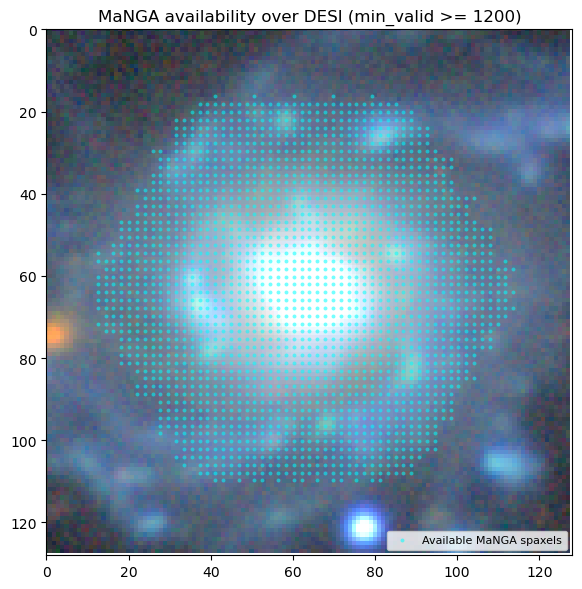

Available MaNGA spaxels inside DESI bounds: 2028 / 3844


In [22]:
# Quick availability map: MaNGA spaxels overlaid on DESI image
pix_scale = 0.262
min_valid_plot = 1200  # loosen/tighten this threshold as needed

plateifu, _ = extractor.match_manga(target_ra, target_dec)
cube_path = extractor._cube_path(plateifu)
with fits.open(cube_path) as h:
    cube_flux = np.asarray(h['FLUX'].data, dtype=np.float64)
    cube_ivar = np.asarray(h['IVAR'].data, dtype=np.float64) if 'IVAR' in h else None
    cube_mask = np.asarray(h['MASK'].data) if 'MASK' in h else None
    w = WCS(h['FLUX'].header).celestial
    ny, nx = cube_flux.shape[1], cube_flux.shape[2]

bad = ~np.isfinite(cube_flux)
if cube_ivar is not None:
    bad |= (~np.isfinite(cube_ivar)) | (cube_ivar <= 0)
if cube_mask is not None:
    bad |= (cube_mask != 0)
valid_counts = np.sum(~bad, axis=0)

iy_grid, ix_grid = np.indices((ny, nx))
ra_grid, dec_grid = w.pixel_to_world_values(ix_grid.ravel(), iy_grid.ravel())
x_off = (ra_grid - target_ra) * np.cos(np.deg2rad(target_dec)) * 3600.0 / pix_scale
y_off = (dec_grid - target_dec) * 3600.0 / pix_scale
x_off = x_off.reshape(ny, nx)
y_off = y_off.reshape(ny, nx)

inside_desi = (np.abs(x_off) <= 63) & (np.abs(y_off) <= 63)
available = inside_desi & (valid_counts >= min_valid_plot)

# Convert DESI-centered offsets to image pixels
x_img = x_off[available] + 64.0
y_img = 64.0 - y_off[available]

plt.figure(figsize=(6, 6))
plt.imshow(desi_rgb)
plt.scatter(x_img, y_img, s=8, c='cyan', alpha=0.55, linewidths=0, label='Available MaNGA spaxels')
plt.xlim(0, 128)
plt.ylim(128, 0)
plt.title(f'MaNGA availability over DESI (min_valid >= {min_valid_plot})')
plt.legend(loc='lower right', fontsize=8)
plt.tight_layout()
plt.show()

print(f'Available MaNGA spaxels inside DESI bounds: {available.sum()} / {inside_desi.sum()}')

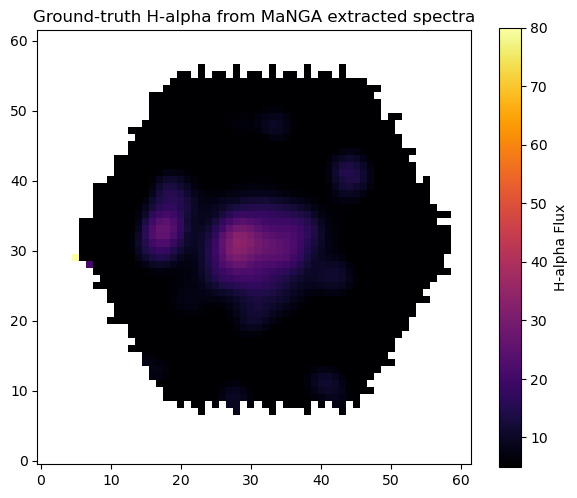

Fitted spaxels: 1955 / 2028 available


In [ ]:
# Ground-truth MaNGA Halpha map from extracted spectra (not MaNGA map products)
if 'manga_available_mask' not in globals():
    raise RuntimeError('Run Cell 11 first to build manga_available_mask and cube variables.')

if 'extract_halpha_kinematics' not in globals():
    raise RuntimeError('Run the kinematics-function cell first so extract_halpha_kinematics is defined.')

# Use object redshift from current batch
z_obj = float(z[0].detach().cpu().item()) if hasattr(z, 'detach') else float(np.asarray(z).reshape(-1)[0])

halpha_gt = np.full((ny, nx), np.nan, dtype=np.float64)
fit_ok = np.zeros((ny, nx), dtype=bool)

ys, xs = np.where(manga_available_mask)
for iy, ix in zip(ys, xs):
    flux_1d = np.asarray(cube_flux[:, iy, ix], dtype=np.float64)
    ivar_1d = np.asarray(cube_ivar[:, iy, ix], dtype=np.float64) if cube_ivar is not None else None

    # Keep only physically valid pixels before fitting
    good = np.isfinite(flux_1d)
    if ivar_1d is not None:
        good &= np.isfinite(ivar_1d) & (ivar_1d > 0)
    if cube_mask is not None:
        good &= (cube_mask[:, iy, ix] == 0)

    if np.sum(good) < 30:
        continue

    f = flux_1d.copy()
    iv = None if ivar_1d is None else ivar_1d.copy()
    f[~good] = np.nan
    if iv is not None:
        iv[~good] = np.nan

    try:
        out = extract_halpha_kinematics(
            spectra=f,
            wave_obs=wave_manga,
            redshifts=z_obj,
            ivar=iv,
            return_dataframe=False,
        )
        halpha_gt[iy, ix] = out['halpha_flux']
        fit_ok[iy, ix] = np.isfinite(out['halpha_flux'])
    except Exception:
        # Leave as NaN where fitting fails
        continue

In [ ]:
# Display all confirmed DESI-MaNGA matches in chunks of 50.
# Each object is shown as a pair: DESI image on the left, MaNGA Halpha map on the right.

if 'matches_df' not in globals():
    raise RuntimeError('matches_df not found. Run cell 4 first to load pre-matched DESI-MaNGA pairs.')
if 'plateifu' not in matches_df.columns or 'TARGETID' not in matches_df.columns:
    raise RuntimeError('matches_df must contain TARGETID and plateifu columns.')
if 'desi_tab' not in globals():
    raise RuntimeError('desi_tab not found. Run cell 4 first to load the DESI table.')

chunk_size = 50
map_tag = extractor.map_daptype
cache_dir = extractor.maps_cache_dir

matched_rows = []
for _, row in matches_df.iterrows():
    plateifu = str(row['plateifu'])
    targetid = int(row['TARGETID'])
    hit = desi_tab.loc[desi_tab['TARGETID'] == targetid]
    if hit.empty:
        continue
    matched_rows.append((targetid, plateifu, int(hit.index[0]), float(row.get('RA', np.nan)), float(row.get('DEC', np.nan))))

if len(matched_rows) == 0:
    raise RuntimeError('No matched rows found with a DESI lookup.')

print(f'Displaying {len(matched_rows)} matched pairs in chunks of {chunk_size}')

for chunk_start in range(0, len(matched_rows), chunk_size):
    chunk = matched_rows[chunk_start:chunk_start + chunk_size]
    n_rows = int(np.ceil(len(chunk) / 5))
    fig, axes = plt.subplots(n_rows, 10, figsize=(24, 3.6 * n_rows))
    axes = np.atleast_2d(axes)

    for ax in axes.ravel()[2 * len(chunk):]:
        ax.axis('off')

    for i, (targetid, plateifu, desi_index, ra, dec) in enumerate(chunk):
        row_idx = i // 5
        col = (i % 5) * 2
        ax_desi = axes[row_idx, col]
        ax_ha = axes[row_idx, col + 1]

        try:
            loader = extractor.get_loader(desi_index)
            batch = next(iter(loader))
            img_6ch = batch[4][0].detach().cpu().numpy()
            desi_rgb = make_rgb(img_6ch[[0, 1, 3]], 'ls_grz')
            ax_desi.imshow(desi_rgb, origin='lower')
            ax_desi.set_title(f'{plateifu}\nDESI', fontsize=7)
        except Exception as e:
            ax_desi.text(0.5, 0.5, f'DESI\n{str(e)[:18]}', ha='center', va='center', fontsize=6)
            ax_desi.set_title(f'{plateifu}\nDESI', fontsize=7)
        ax_desi.axis('off')

        try:
            maps = extractor.get_maps(plateifu)
            ha_flux = maps['ha_flux']
            ax_ha.imshow(ha_flux, cmap='magma', origin='lower')
            ax_ha.set_title(f'{targetid}\nHalpha', fontsize=7)
        except Exception as e:
            ax_ha.text(0.5, 0.5, f'Halpha\n{str(e)[:18]}', ha='center', va='center', fontsize=6)
            ax_ha.set_title(f'{targetid}\nHalpha', fontsize=7)
        ax_ha.axis('off')

    plt.suptitle(f'Confirmed DESI-MaNGA matches {chunk_start + 1}-{chunk_start + len(chunk)} of {len(matched_rows)}', y=1.01)
    plt.tight_layout()
    plt.show()

print(f'Displayed {len(matched_rows)} matched pairs total.')

Metrics computed against native-orientation MaNGA ground truth:
           map  n_pix  pearson   cosine
halphas_simple   1881  0.91156 0.912314
       halphas   1881  0.84555 0.826672
Projected maps identical (allclose): False
Delta std: 16.1304, delta max abs: 112.542


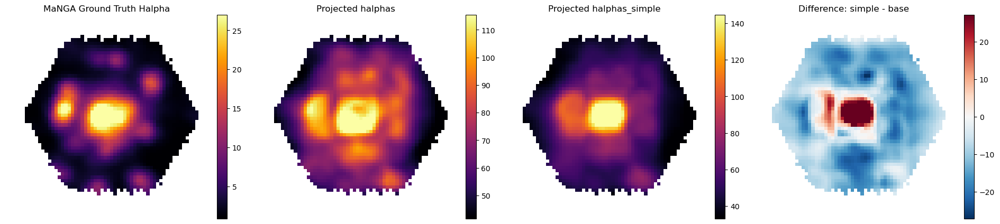

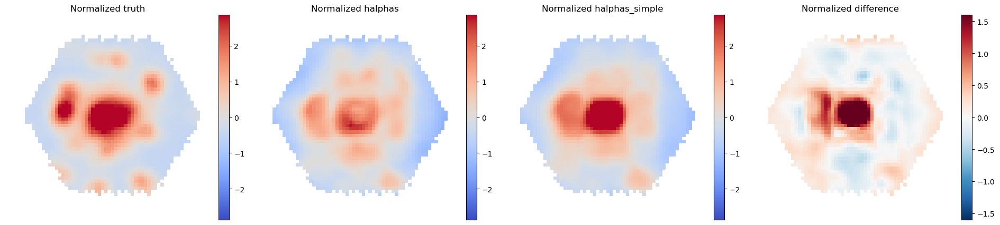

In [12]:
# Compare halphas vs halphas_simple against actual MaNGA Halpha map
import os
import numpy as np
import pandas as pd
from scipy.interpolate import griddata
from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt

if 'extractor' not in globals() or 'target_ra' not in globals() or 'target_dec' not in globals():
    raise RuntimeError('Need extractor, target_ra, target_dec in memory.')
if 'plateifu' not in globals():
    plateifu, _ = extractor.match_manga(float(target_ra), float(target_dec))

# if os.path.exists('halphas.npy') and os.path.exists('halphas_simple.npy'):
#     halphas = np.load('halphas.npy')
halphas_simple = np.load('halphas_simple.npy')
# elif 'halphas' in globals() and 'halphas_simple' in globals():
#     halphas = np.asarray(halphas)
#     halphas_simple = np.asarray(halphas_simple)
# else:
#     raise RuntimeError('Need halphas and halphas_simple either in memory or saved as .npy files.')

maps = extractor.get_maps(plateifu)
truth_raw = np.asarray(maps['ha_flux'], dtype=np.float64)
manga_footprint = np.isfinite(truth_raw)

# Keep native MaNGA map orientation and use consistent sky->xy sign convention.
truth = truth_raw.copy()

maps_path = extractor._maps_path(plateifu)
with fits.open(maps_path) as h:
    wcs_map = WCS(h['SPX_MFLUX'].header).celestial

ny, nx = truth_raw.shape
iy, ix = np.indices((ny, nx))
ra_grid, dec_grid = wcs_map.pixel_to_world_values(ix.ravel(), iy.ravel())

pix_scale = 0.262
ra_to_x_sign = -1.0
dec_to_y_sign = -1.0
x_off = (
    ra_to_x_sign * (ra_grid - float(target_ra)) * np.cos(np.deg2rad(float(target_dec))) * 3600.0 / pix_scale
).reshape(ny, nx)
y_off = (
    dec_to_y_sign * (dec_grid - float(target_dec)) * 3600.0 / pix_scale
).reshape(ny, nx)

def project_to_manga_grid(src_map):
    src = np.asarray(src_map, dtype=np.float64)
    if src.ndim != 2:
        raise ValueError(f'Expected 2D source map, got {src.shape}')

    if 'xs' in globals() and 'ys' in globals():
        xs_arr = xs.detach().cpu().numpy() if hasattr(xs, 'detach') else np.asarray(xs)
        ys_arr = ys.detach().cpu().numpy() if hasattr(ys, 'detach') else np.asarray(ys)
        if xs_arr.size == src.shape[1] and ys_arr.size == src.shape[0]:
            x_src = xs_arr.astype(np.float64)
            y_src = ys_arr.astype(np.float64)
        else:
            x_src = np.linspace(-60.0, 60.0, src.shape[1])
            y_src = np.linspace(60.0, -60.0, src.shape[0])
    else:
        x_src = np.linspace(-60.0, 60.0, src.shape[1])
        y_src = np.linspace(60.0, -60.0, src.shape[0])

    xx_src, yy_src = np.meshgrid(x_src, y_src)
    valid_src = np.isfinite(src)
    if int(valid_src.sum()) < 10:
        raise RuntimeError('Too few finite points in source map.')

    src_points = np.column_stack([xx_src[valid_src], yy_src[valid_src]])
    src_values = src[valid_src]
    sample_points = np.column_stack([x_off.ravel(), y_off.ravel()])

    proj_linear = griddata(src_points, src_values, sample_points, method='linear').reshape(ny, nx)
    proj_nearest = griddata(src_points, src_values, sample_points, method='nearest').reshape(ny, nx)

    inside_src = (
        (x_off >= np.min(x_src)) & (x_off <= np.max(x_src)) &
        (y_off >= np.min(y_src)) & (y_off <= np.max(y_src))
    )

    proj = np.where(inside_src, proj_linear, np.nan)
    need_fill = np.isnan(proj) & inside_src
    proj[need_fill] = proj_nearest[need_fill]
    proj = np.where(manga_footprint, proj, np.nan)
    return proj

def robust_normalize(x):
    x = np.asarray(x, dtype=np.float64)
    m = np.nanmedian(x)
    q25, q75 = np.nanpercentile(x, [25, 75])
    iqr = q75 - q25
    if not np.isfinite(iqr) or iqr <= 0:
        s = np.nanstd(x)
        if not np.isfinite(s) or s <= 0:
            s = 1.0
        return (x - m) / s
    return (x - m) / iqr

def compute_metrics(pred_proj, truth_map):
    mask = np.isfinite(pred_proj) & np.isfinite(truth_map)
    n = int(mask.sum())
    if n < 10:
        return {'n_pix': n, 'pearson': np.nan, 'cosine': np.nan}

    p = robust_normalize(pred_proj[mask])
    t = robust_normalize(truth_map[mask])

    pearson = float(np.corrcoef(p, t)[0, 1])
    denom = np.linalg.norm(p) * np.linalg.norm(t)
    cosine = float(np.dot(p, t) / denom) if denom > 0 else np.nan
    return {'n_pix': n, 'pearson': pearson, 'cosine': cosine}

halphas_proj = project_to_manga_grid(halphas)
halphas_simple_proj = project_to_manga_grid(halphas_simple)

m1 = compute_metrics(halphas_proj, truth)
m2 = compute_metrics(halphas_simple_proj, truth)

df = pd.DataFrame([
    {'map': 'halphas', **m1},
    {'map': 'halphas_simple', **m2},
]).sort_values(['pearson', 'cosine'], ascending=False)
print('Metrics computed against native-orientation MaNGA ground truth:')
print(df.to_string(index=False))

common = np.isfinite(halphas_proj) & np.isfinite(halphas_simple_proj)
if int(common.sum()) < 10:
    raise RuntimeError('Not enough overlapping finite pixels between projected maps.')
map_delta = np.where(common, halphas_simple_proj - halphas_proj, np.nan)
same = np.allclose(halphas_proj[common], halphas_simple_proj[common], rtol=1e-6, atol=1e-8)
print(f'Projected maps identical (allclose): {same}')
print(f'Delta std: {np.nanstd(map_delta):.6g}, delta max abs: {np.nanmax(np.abs(map_delta)):.6g}')

def panel_limits(arr):
    v = arr[np.isfinite(arr)]
    if v.size < 10:
        return (0.0, 1.0)
    lo, hi = np.nanpercentile(v, [3, 97])
    if (not np.isfinite(lo)) or (not np.isfinite(hi)) or (hi <= lo):
        lo, hi = np.nanmin(v), np.nanmax(v)
        if (not np.isfinite(lo)) or (not np.isfinite(hi)) or (hi <= lo):
            return (0.0, 1.0)
    return (float(lo), float(hi))

v0, v1 = panel_limits(truth)
v2, v3 = panel_limits(halphas_proj)
v4, v5 = panel_limits(halphas_simple_proj)
vd = np.nanpercentile(np.abs(map_delta[np.isfinite(map_delta)]), 97) if np.isfinite(map_delta).any() else 1.0
if (not np.isfinite(vd)) or (vd <= 0):
    vd = 1.0

# Raw-value figure
fig, ax = plt.subplots(1, 4, figsize=(19, 4.5))
im0 = ax[0].imshow(truth, origin='lower', cmap='inferno', vmin=v0, vmax=v1)
ax[0].set_title('MaNGA Ground Truth Halpha')
ax[0].axis('off')
plt.colorbar(im0, ax=ax[0], fraction=0.046, pad=0.04)

im1 = ax[1].imshow(halphas_proj, origin='lower', cmap='inferno', vmin=v2, vmax=v3)
ax[1].set_title('Projected halphas')
ax[1].axis('off')
plt.colorbar(im1, ax=ax[1], fraction=0.046, pad=0.04)

im2 = ax[2].imshow(halphas_simple_proj, origin='lower', cmap='inferno', vmin=v4, vmax=v5)
ax[2].set_title('Projected halphas_simple')
ax[2].axis('off')
plt.colorbar(im2, ax=ax[2], fraction=0.046, pad=0.04)

im3 = ax[3].imshow(map_delta, origin='lower', cmap='RdBu_r', vmin=-vd, vmax=vd)
ax[3].set_title('Difference: simple - base')
ax[3].axis('off')
plt.colorbar(im3, ax=ax[3], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

# Normalized figure (robustly normalized maps)
truth_n = np.full_like(truth, np.nan, dtype=np.float64)
halphas_n = np.full_like(halphas_proj, np.nan, dtype=np.float64)
simple_n = np.full_like(halphas_simple_proj, np.nan, dtype=np.float64)

vt = np.isfinite(truth)
vh = np.isfinite(halphas_proj)
vs = np.isfinite(halphas_simple_proj)

truth_n[vt] = robust_normalize(truth[vt])
halphas_n[vh] = robust_normalize(halphas_proj[vh])
simple_n[vs] = robust_normalize(halphas_simple_proj[vs])
delta_n = simple_n - halphas_n

vals = np.concatenate([
    truth_n[np.isfinite(truth_n)],
    halphas_n[np.isfinite(halphas_n)],
    simple_n[np.isfinite(simple_n)]
])
vnorm = np.nanpercentile(np.abs(vals), 97) if vals.size > 0 else 1.0
if (not np.isfinite(vnorm)) or (vnorm <= 0):
    vnorm = 1.0
vdn = np.nanpercentile(np.abs(delta_n[np.isfinite(delta_n)]), 97) if np.isfinite(delta_n).any() else 1.0
if (not np.isfinite(vdn)) or (vdn <= 0):
    vdn = 1.0

fig, ax = plt.subplots(1, 4, figsize=(19, 4.5))
im0 = ax[0].imshow(truth_n, origin='lower', cmap='coolwarm', vmin=-vnorm, vmax=vnorm)
ax[0].set_title('Normalized truth')
ax[0].axis('off')
plt.colorbar(im0, ax=ax[0], fraction=0.046, pad=0.04)

im1 = ax[1].imshow(halphas_n, origin='lower', cmap='coolwarm', vmin=-vnorm, vmax=vnorm)
ax[1].set_title('Normalized halphas')
ax[1].axis('off')
plt.colorbar(im1, ax=ax[1], fraction=0.046, pad=0.04)

im2 = ax[2].imshow(simple_n, origin='lower', cmap='coolwarm', vmin=-vnorm, vmax=vnorm)
ax[2].set_title('Normalized halphas_simple')
ax[2].axis('off')
plt.colorbar(im2, ax=ax[2], fraction=0.046, pad=0.04)

im3 = ax[3].imshow(delta_n, origin='lower', cmap='RdBu_r', vmin=-vdn, vmax=vdn)
ax[3].set_title('Normalized difference')
ax[3].axis('off')
plt.colorbar(im3, ax=ax[3], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()
